In [1]:
# The phenotypic characteristics of each stomata complex is extracted by the Mask RCNN and CellProifler pipeline
# !pip install pycytominer
import pandas as pd
import pycytominer
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

In [2]:
df = pd.read_csv("./cellProfiler/GC_SC_merge.csv")

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('ki3', 'Ki3')

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('p39', 'P39')

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('P39Gb', 'P39')

print(df['Metadata_genotype.x'].unique())

# Get the dimensions of the DataFrame 
num_rows, num_columns = df.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

# filter the df [for this step, around 9 guard cells have extremely small values and 0, so I just deleted them.]

df_filtered = df[df['GCO_AreaShape_Area'] >= 100]
num_rows, num_columns = df_filtered.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")
# Convert 'Metadata_number.x' column to the same data type as 'Round'
df_filtered['Metadata_number.x'] = df_filtered['Metadata_number.x'].astype(str)


['B73' 'CML103' 'CML228' 'HP301' 'Ki3' 'Mo17' 'Mo18w' 'Ms71' 'NC358' 'P39']
Number of Rows: 2434, Number of Columns: 119
Number of Rows: 2425, Number of Columns: 119


/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_99035/3463323096.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Metadata_number.x'] = df_filtered['Metadata_number.x'].astype(str)


In [3]:
df_filtered

Group_info = pd.read_csv("./Genotype_group.csv")
df_filtered  = pd.merge(df_filtered, Group_info, left_on='Metadata_genotype.x', right_on='Genotype', how='left')
df_filtered.head()

,Unnamed: 0,ImageNumber.x,ObjectNumber,Metadata_FileLocation,Metadata_Frame.x,Metadata_Series.x,Metadata_genotype.x,Metadata_number.x,Metadata_week.x,GCO_AreaShape_Area,...,sco2_AreaShape_Perimeter,sco2_AreaShape_Solidity,sco2_Children_sco2_Count,Location_Center_X,Location_Center_Y,Location_Center_Z,Number_Object_Number,Genotype,Group,Subgroup
0,1,1,1,file:/Users/houlinyu/Desktop/colored_masks/Wee...,0,0,B73,1,Week1,405,...,95.012193,0.867220,1,47.753589,120.294258,0,3,B73,SS,SS-B73
1,2,1,2,file:/Users/houlinyu/Desktop/colored_masks/Wee...,0,0,B73,1,Week1,381,...,85.941125,0.908257,1,227.007576,129.825758,0,4,B73,SS,SS-B73
2,3,1,3,file:/Users/houlinyu/Desktop/colored_masks/Wee...,0,0,B73,1,Week1,490,...,99.597980,0.862786,1,24.836145,230.901205,0,7,B73,SS,SS-B73
3,4,1,4,file:/Users/houlinyu/Desktop/colored_masks/Wee...,0,0,B73,1,Week1,416,...,95.597980,0.854260,1,164.763780,228.060367,0,6,B73,SS,SS-B73
4,5,1,5,file:/Users/houlinyu/Desktop/colored_masks/Wee...,0,0,B73,1,Week1,410,...,84.148232,0.927374,1,281.015060,259.828313,0,11,B73,SS,SS-B73


55


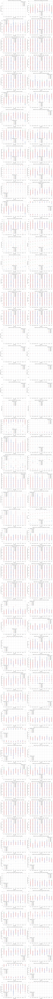

In [4]:
# Select relevant columns (assuming you want to plot all numeric columns except 'Metadata_number.x' and 'Metadata_Series.x')
numeric_columns = df_filtered.select_dtypes(include='number').columns.difference(['Metadata_number.x', 'Metadata_Series.x'])

# Define the number of columns for subplots
num_cols = 2
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols
print(num_rows)

# Plotting using seaborn in a high-throughput way
sns.set(style="whitegrid")
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, col in enumerate(numeric_columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx] if num_rows > 1 else axes[col_idx]
    
    sns.scatterplot(x='Metadata_genotype.x', y=col, data=df_filtered, hue='Metadata_week.x', ax=ax)
    ax.set_title(f'Scatter Plot of {col} by Genotype')
    ax.set_xlabel('Genotype')
    ax.set_ylabel(col)

# Adjust layout
plt.tight_layout()
plt.show()

In [5]:
#preprocessing extracted features
#The first step: check the Missing values, and Print out columns with missing values, if any

num_rows, num_columns = df_filtered.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

columns_with_missing_values = df_filtered.columns[df_filtered.isnull().any()]
if not columns_with_missing_values.empty:
    print("Columns with missing values:")
    for column in columns_with_missing_values:
        print(column)
        
# Drop rows with missing values
df_noNA = df_filtered.dropna()

# Print number of rows and columns after dropping missing values
num_rows, num_columns = df_noNA.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

# Print missing values after dropping rows with missing values
missing_values = df_noNA.isnull().sum()
print("Missing values after dropping rows:")
print(missing_values)
print(df_noNA.shape)

Number of Rows: 2425, Number of Columns: 122
Columns with missing values:
Genotype
Group
Subgroup
Number of Rows: 2229, Number of Columns: 122
Missing values after dropping rows:
Unnamed: 0               0
ImageNumber.x            0
ObjectNumber             0
Metadata_FileLocation    0
Metadata_Frame.x         0
                        ..
Location_Center_Z        0
Number_Object_Number     0
Genotype                 0
Group                    0
Subgroup                 0
Length: 122, dtype: int64
(2229, 122)


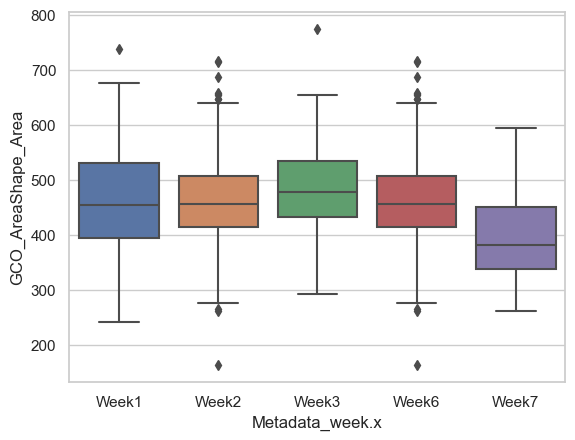

In [6]:
# The Batch-effect correction ?
# Assuming 'df' is your DataFrame

sns.boxplot(x='Metadata_week.x', y='GCO_AreaShape_Area', data=df_noNA)
plt.show()

In [7]:
#Feature Selection manually

df = df_noNA.copy()
print(df)
column_names_list = list(df.columns)
print(column_names_list)
features_list = [
    'Area',
    'Perimeter',
    'FormFactor',
    'Convex Area',
    'Solidity',
    'Extent',
    'BoundingBoxArea',
    'Eccentricity',
    'MajorAxisLength',
    'MinorAxisLength',
    'EquivalentDiameter',
    'Compactness',
    'MaximumRadius',
    'MedianRadius',
    'MeanRadius',
    'MinFeretDiameter',
    'MaxFeretDiameter'
]

# Find column names containing substrings from the features_list
matching_cols = [col for col in column_names_list if any(
    feature in col for feature in features_list) and 'Orientation' not in col and '_X' not in col and '_Y' not in col and 'EulerNumber' not in col]

col_lists = ['Metadata_week.x', 'Metadata_genotype.x', "Group", "Subgroup", "GCO_stomata_desity"] + matching_cols
df_feature_filtered = df.loc[:, col_lists]
print(df_feature_filtered.shape)

      Unnamed: 0  ImageNumber.x  ObjectNumber  \
0              1              1             1   
1              2              1             2   
2              3              1             3   
3              4              1             4   
4              5              1             5   
...          ...            ...           ...   
2420        2430            201             9   
2421        2431            201            10   
2422        2432            201            11   
2423        2433            201            12   
2424        2434            201            13   

                                  Metadata_FileLocation  Metadata_Frame.x  \
0     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
1     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
2     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
3     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
4     file:/Users/houlinyu

In [8]:
# Check for infinity values in sco2_AreaShape_FormFactor column

df = df_feature_filtered.copy()
inf_mask = np.isinf(
df['sco2_AreaShape_FormFactor'])

# Print the number of INF values
num_inf_values = inf_mask.sum()
print("Number of INF values:", num_inf_values)

# Remove rows with INF values
df_feature_filtered = df[~inf_mask]

# Optionally, you can reset the index if needed
df_feature_filtered = df_feature_filtered.reset_index(drop=True)

# Save the cleaned DataFrame to a new CSV file
df_feature_filtered.to_csv("Oscar_morph.csv", index=False)
df_feature_filtered.shape

Number of INF values: 1


(2228, 56)

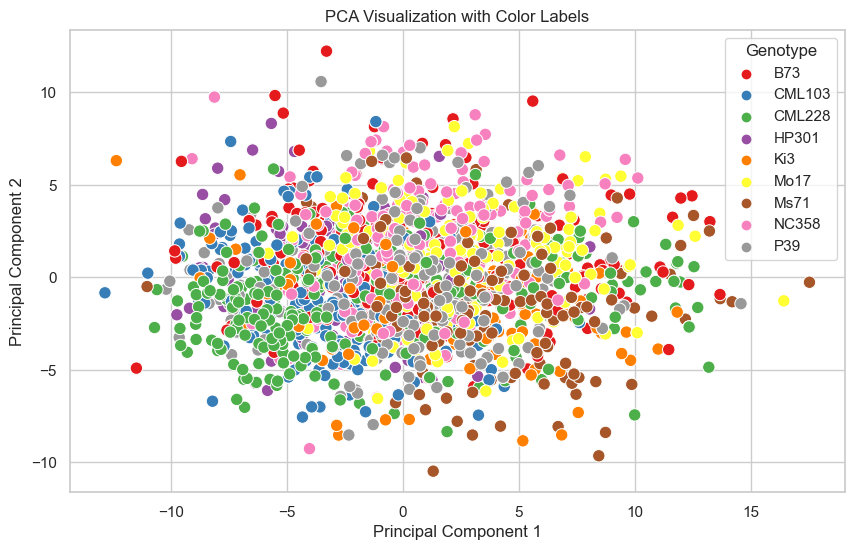

In [9]:
# Select numeric columns for normalization

df = df_feature_filtered.copy()

numeric_columns = df.select_dtypes(include='number')

# Create a StandardScaler, Z score normalization
scaler = StandardScaler()

# Fit and transform the selected numeric columns
normalized_data = scaler.fit_transform(numeric_columns)

# Replace the original numeric columns with the normalized values
df[numeric_columns.columns] = normalized_data


df.to_csv("Oscar_scaled_morph.csv", index=False)

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(normalized_data)

# Create a DataFrame with PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
pca_df = pd.DataFrame(data=pca_result, columns=pca_columns)

# Concatenate the PCA DataFrame with non-numeric columns
final_df = pd.concat([df.drop(columns=numeric_columns.columns), pca_df], axis=1)

final_df.to_csv("final_df.csv")

# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(x='PC1', y='PC2', hue='Metadata_genotype.x', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Genotype')

plt.show()


In [11]:
# Group by week and genotype and calculate the mean for all columns
df_morph = df_feature_filtered.copy()
aggregated_df = df_morph.groupby(['Metadata_week.x', 'Metadata_genotype.x']).mean().reset_index()
aggregated_df['Metadata_week.x'] = aggregated_df['Metadata_week.x'].str.extract('(\d+)')
aggregated_df['Metadata_week.x'] = aggregated_df['Metadata_week.x'].astype(str)

# Display the aggregated DataFrame
#print(aggregated_df)

#Metadata_week.x Metadata_genotype.x
gs_data = pd.read_csv("/users/houlinyu/Desktop/umass/image_analysis/gs_closing.csv")
aggregated_df.head()



merged_gs_df_allSCs = pd.merge(aggregated_df, gs_data, 
                     left_on=['Metadata_week.x', 'Metadata_genotype.x'], 
                     right_on=['Round', 'Genotype'], 
                     how='left')


merged_gs_df_allSCs.head()
print(merged_gs_df_allSCs)

   Metadata_week.x Metadata_genotype.x  GCO_stomata_desity  \
0                1                 B73           11.384615   
1                1              CML103            9.654545   
2                1              CML228           10.660000   
3                1               HP301           15.045455   
4                1                 Ki3           11.936709   
5                1                Mo17           15.000000   
6                1                Ms71            9.851064   
7                1               NC358           12.126761   
8                1                 P39           11.246154   
9                2                 B73           14.142857   
10               2              CML103           12.070423   
11               2              CML228           12.388889   
12               2               HP301           13.000000   
13               2                 Ki3           11.521739   
14               2                Mo17           15.134831   
15      

/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_99035/3397257947.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_df = df_morph.groupby(['Metadata_week.x', 'Metadata_genotype.x']).mean().reset_index()


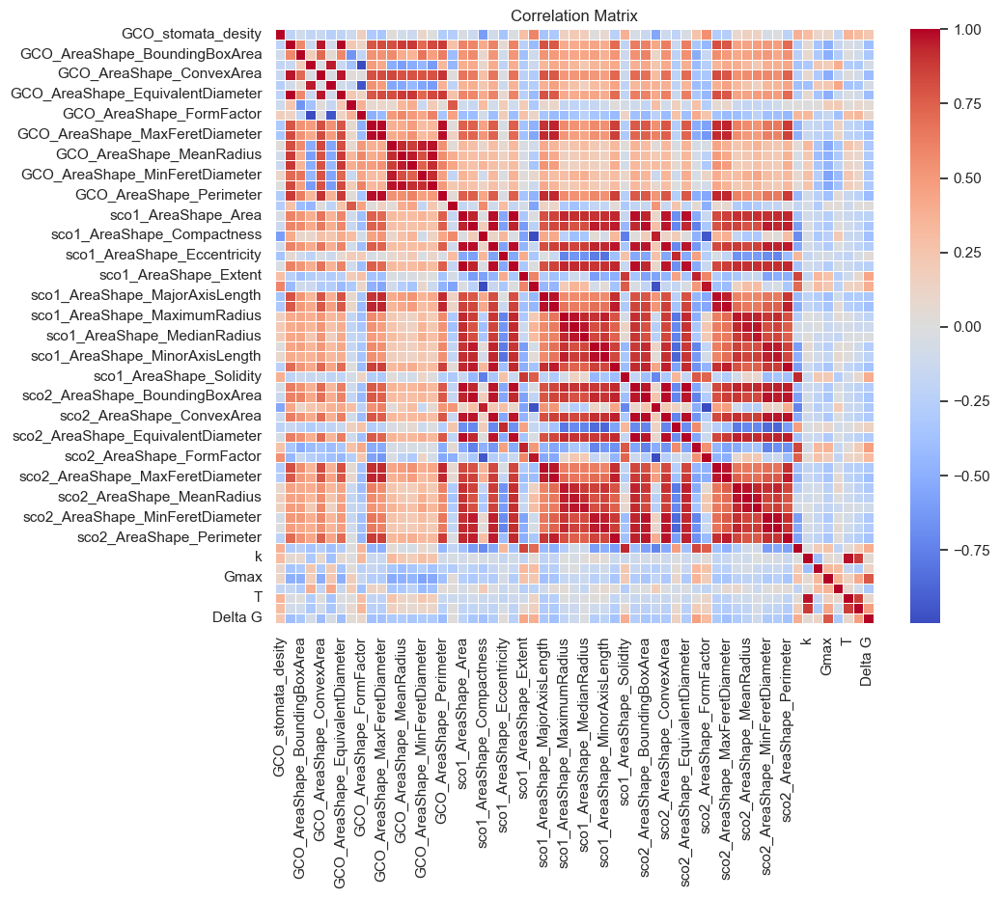

In [12]:
# Identify numeric and non-numeric columns

df = merged_gs_df_allSCs.copy()
numeric_columns = df.select_dtypes(include=['number']).columns
non_numeric_columns = df.select_dtypes(exclude=['number']).columns


# Separate data into numeric and non-numeric DataFrames
numeric_data = df[numeric_columns]
non_numeric_data = df[non_numeric_columns]

# Scale the numeric data using StandardScaler
scaler = StandardScaler()
scaled_numeric_data = scaler.fit_transform(numeric_data)
#print(scaled_numeric_data)
# Convert the scaled numeric data back to a DataFrame
scaled_numeric_df = pd.DataFrame(scaled_numeric_data, columns=numeric_columns)

# Concatenate the non-numeric data and the scaled numeric data
scaled_df = pd.concat([non_numeric_data, scaled_numeric_df], axis=1)

#scaled_df.to_csv("scaled_gs_morphology.csv", index = False)



# Select columns for correlation
selected_columns = numeric_data.dropna()
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

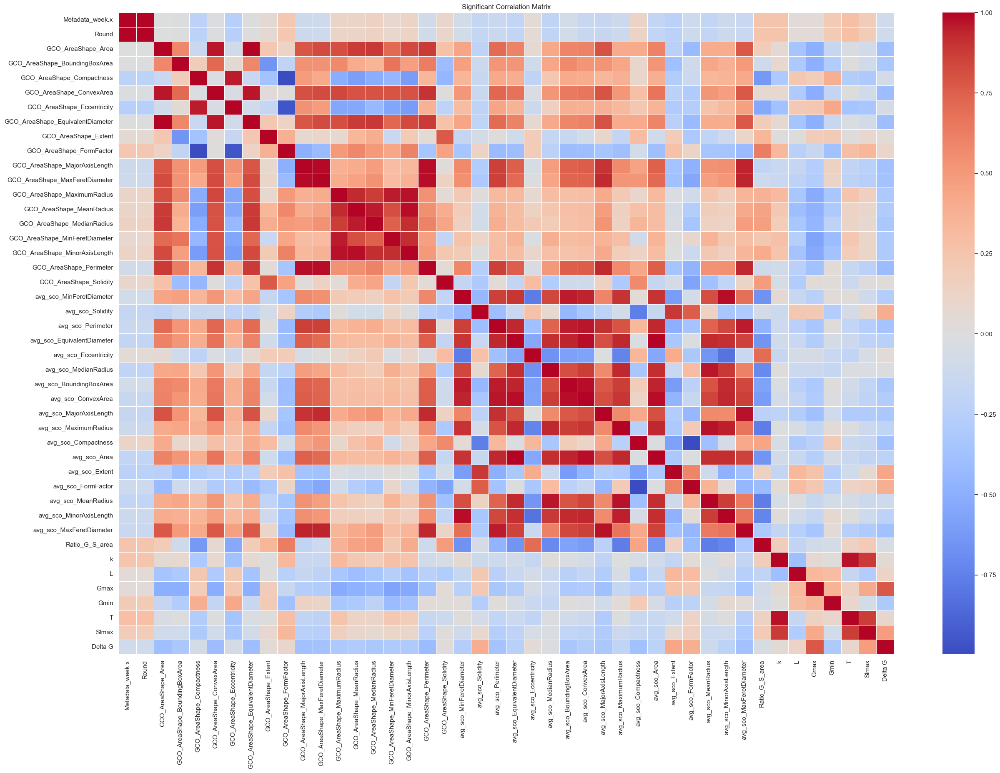

In [13]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataframe (assuming it's named merged_gs_df_allSCs)
df =  pd.read_csv("scaled_gs_morphology.csv")

# Select numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns

# Separate data into numeric and non-numeric DataFrames
numeric_data = df[numeric_columns]

# Drop NaN values
numeric_data = numeric_data.dropna()

# Calculate correlations
correlation_matrix = numeric_data.corr(method='pearson')

# Calculate p-values
p_values = pd.DataFrame(np.zeros_like(correlation_matrix.values), columns=correlation_matrix.columns, index=correlation_matrix.index)

for col in correlation_matrix.columns:
    for idx in correlation_matrix.index:
        corr, p_value = pearsonr(numeric_data[col], numeric_data[idx])
        p_values.loc[idx, col] = p_value

# Filter for significant correlations (p < 0.05)
significant_correlations = correlation_matrix[(p_values < 0.01) & (p_values != 0)]

# Create a heatmap of the significant correlation matrix
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Significant Correlation Matrix')
plt.show()


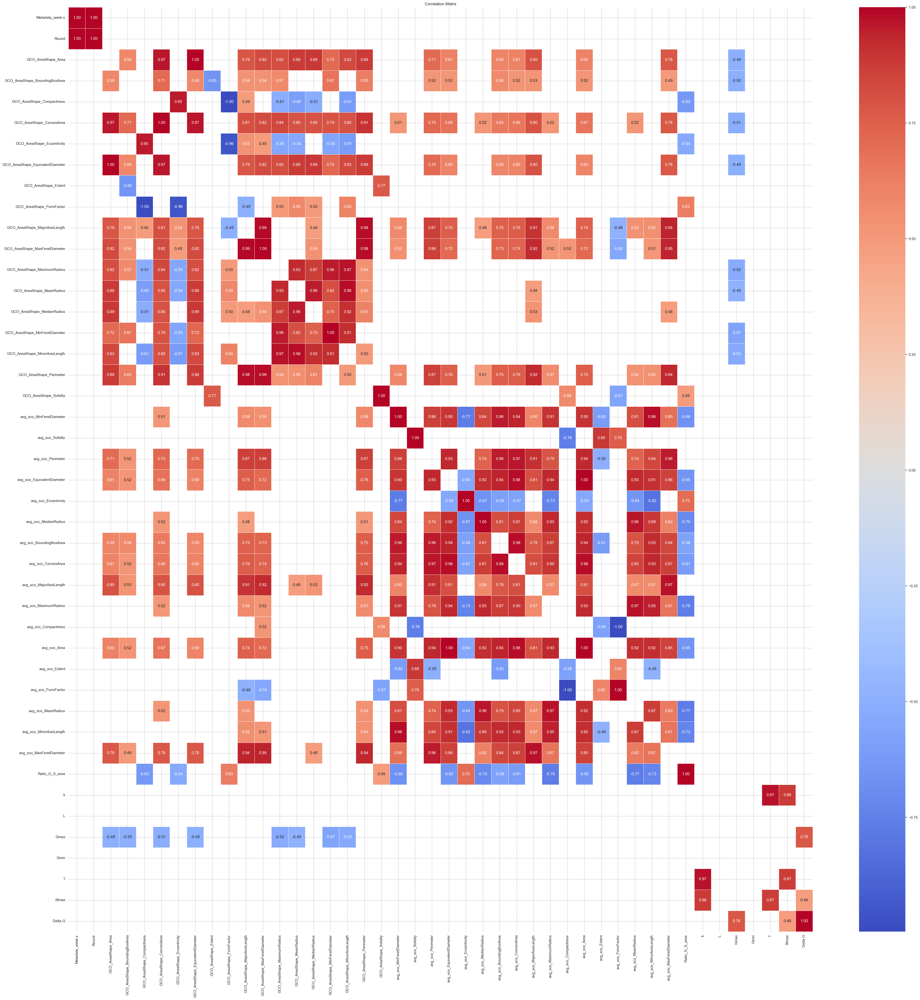

In [14]:
plt.figure(figsize=(50, 50))
sns.heatmap(significant_correlations, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.4)
plt.title('Correlation Matrix')
plt.show()



In [17]:
df = df_feature_filtered.copy()
print(df)

df['GCO_stomata_area'] = df['sco1_AreaShape_Area'] + df['sco2_AreaShape_Area'] + df['GCO_AreaShape_Area']
df_SCO = df.filter(regex=r'^(sco1_|sco2_)')
print(df.shape)
print(df_SCO.shape)

df_GCO = df.drop(columns = df_SCO)
df_GCO.head()
print(df_SCO.shape)
df_SCO.head()


     Metadata_week.x Metadata_genotype.x Group  Subgroup  GCO_stomata_desity  \
0              Week1                 B73    SS    SS-B73                  10   
1              Week1                 B73    SS    SS-B73                  10   
2              Week1                 B73    SS    SS-B73                  10   
3              Week1                 B73    SS    SS-B73                  10   
4              Week1                 B73    SS    SS-B73                  10   
...              ...                 ...   ...       ...                 ...   
2223           Week7               NC358  TROP  TROP-TZI                  13   
2224           Week7               NC358  TROP  TROP-TZI                  13   
2225           Week7               NC358  TROP  TROP-TZI                  13   
2226           Week7               NC358  TROP  TROP-TZI                  13   
2227           Week7               NC358  TROP  TROP-TZI                  13   

      GCO_AreaShape_Area  GCO_AreaShape

,sco1_AreaShape_Area,sco1_AreaShape_BoundingBoxArea,sco1_AreaShape_Compactness,sco1_AreaShape_ConvexArea,sco1_AreaShape_Eccentricity,sco1_AreaShape_EquivalentDiameter,sco1_AreaShape_Extent,sco1_AreaShape_FormFactor,sco1_AreaShape_MajorAxisLength,sco1_AreaShape_MaxFeretDiameter,...,sco2_AreaShape_FormFactor,sco2_AreaShape_MajorAxisLength,sco2_AreaShape_MaxFeretDiameter,sco2_AreaShape_MaximumRadius,sco2_AreaShape_MeanRadius,sco2_AreaShape_MedianRadius,sco2_AreaShape_MinFeretDiameter,sco2_AreaShape_MinorAxisLength,sco2_AreaShape_Perimeter,sco2_AreaShape_Solidity
0,418,780,1.791705,478,0.860685,23.069767,0.535897,0.558128,35.727355,38.118237,...,0.581872,35.386544,37.121422,8.000000,3.088725,2.828427,18.676669,18.205109,95.012193,0.867220
1,394,648,1.514640,420,0.824073,22.397687,0.608025,0.660223,31.889203,35.128336,...,0.673757,32.410973,33.136083,8.485281,3.249342,3.000000,17.000000,17.475862,85.941125,0.908257
2,414,840,1.970704,483,0.912109,22.959120,0.492857,0.507433,39.253823,41.773197,...,0.525723,38.516608,40.792156,7.615773,2.942105,2.828427,16.687720,16.650361,99.597980,0.862786
3,336,494,1.787274,363,0.944008,20.683532,0.680162,0.559511,37.555024,37.483330,...,0.523887,36.938439,38.470768,7.071068,2.801328,2.828427,17.292327,15.753251,95.597980,0.854260
4,347,612,1.680303,383,0.875284,21.019375,0.566993,0.595131,32.349275,35.355339,...,0.589194,32.727715,36.221541,7.071068,2.885923,2.828427,14.000000,14.671906,84.148232,0.927374


In [18]:
df_1 = df_SCO.copy()

# Identify unique column names without prefixes "sco1_" and "sco2_"
unique_col_names = set(col.split('_', 2)[2] if col.startswith('sco1_') or col.startswith('sco2_') else col for col in df_1.columns)

# Calculate the average for each unique column name using only the first relevant column of each pair
for col_name in unique_col_names:
    relevant_cols = [col for col in df_1.columns if col.endswith(col_name)]
    first_col = relevant_cols[0]  # Select the first relevant column
    df_1 [f'avg_sco_{col_name}'] = df_1 [first_col]  
df_1.head()
print(df_1.shape)

columns_to_drop = [col for col in df_1.columns if col.startswith('sco')]
df_1 = df_1.drop(columns=columns_to_drop)
df_1.head()
#print(df_1.shape)

df_GC0_AVG_SCO = pd.concat([df_GCO, df_1], axis=1)
df_GC0_AVG_SCO 
print(df_GC0_AVG_SCO.shape)
df_GC0_AVG_SCO.head()

# Add a column with GC0 and SCO ratio

df = df_GC0_AVG_SCO.copy()

df['Ratio_G_S_area'] = (df['GCO_AreaShape_Area']/2) / df['avg_sco_Area']

df_GC0_AVG_SCO = df

df_GC0_AVG_SCO.to_csv("Oscar_scaled_avgSCO.csv")

df.shape



(2228, 51)
(2228, 40)


(2228, 41)

In [19]:

# Display the resulting DataFrame
df_GC0_AVG_SCO.head()
nan_count_per_column = df_GC0_AVG_SCO.isna().sum()
print(nan_count_per_column)
df_GC0_AVG_SCO.head()

Metadata_week.x                     0
Metadata_genotype.x                 0
Group                               0
Subgroup                            0
GCO_stomata_desity                  0
GCO_AreaShape_Area                  0
GCO_AreaShape_BoundingBoxArea       0
GCO_AreaShape_Compactness           0
GCO_AreaShape_ConvexArea            0
GCO_AreaShape_Eccentricity          0
GCO_AreaShape_EquivalentDiameter    0
GCO_AreaShape_Extent                0
GCO_AreaShape_FormFactor            0
GCO_AreaShape_MajorAxisLength       0
GCO_AreaShape_MaxFeretDiameter      0
GCO_AreaShape_MaximumRadius         0
GCO_AreaShape_MeanRadius            0
GCO_AreaShape_MedianRadius          0
GCO_AreaShape_MinFeretDiameter      0
GCO_AreaShape_MinorAxisLength       0
GCO_AreaShape_Perimeter             0
GCO_AreaShape_Solidity              0
GCO_stomata_area                    0
avg_sco_MajorAxisLength             0
avg_sco_MaxFeretDiameter            0
avg_sco_MedianRadius                0
avg_sco_Exte

,Metadata_week.x,Metadata_genotype.x,Group,Subgroup,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,Week1,B73,SS,SS-B73,10,405,576,2.308191,458,0.983511,...,97.012193,780,478,0.860685,0.558128,3.030867,7.810250,418,18.190126,0.484450
1,Week1,B73,SS,SS-B73,10,381,495,2.239848,432,0.981657,...,86.597980,648,420,0.824073,0.660223,3.238071,8.544004,394,18.064705,0.483503
2,Week1,B73,SS,SS-B73,10,490,954,2.565985,605,0.985667,...,101.254834,840,483,0.912109,0.507433,2.895797,7.280110,414,16.092025,0.591787
3,Week1,B73,SS,SS-B73,10,416,750,2.586656,512,0.986356,...,86.870058,494,363,0.944008,0.559511,2.731353,6.324555,336,12.390288,0.619048
4,Week1,B73,SS,SS-B73,10,410,624,2.315030,475,0.983106,...,85.597980,612,383,0.875284,0.595131,2.913475,7.211103,347,15.644407,0.590778


In [20]:
# In general, Random Forest is not sensitive to the scale of the features

from sklearn.ensemble import RandomForestClassifier


df_GC0_AVG_SCO
df_GC0_AVG_SCO = df_GC0_AVG_SCO.dropna(axis=1)

df_GC0_AVG_SCO.head()


# Assuming X is your feature matrix, y is your target variable (genotype)
#X = df_GC0_AVG_SCO.filter(regex='^(GCO|avg_)').filter(like="Ratio_G_S_area")
X = df_GC0_AVG_SCO.filter(regex='^(GCO|avg_)')
y = df_GC0_AVG_SCO['Metadata_genotype.x']

# Initialize the RandomForestClassifier, random_state: 
rf_classifier = RandomForestClassifier(n_estimators=1000, random_state=None)


# Fit the classifier to your data
rf_classifier.fit(X, y)
df_GC0_AVG_SCO.head()

,Metadata_week.x,Metadata_genotype.x,Group,Subgroup,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,Week1,B73,SS,SS-B73,10,405,576,2.308191,458,0.983511,...,97.012193,780,478,0.860685,0.558128,3.030867,7.810250,418,18.190126,0.484450
1,Week1,B73,SS,SS-B73,10,381,495,2.239848,432,0.981657,...,86.597980,648,420,0.824073,0.660223,3.238071,8.544004,394,18.064705,0.483503
2,Week1,B73,SS,SS-B73,10,490,954,2.565985,605,0.985667,...,101.254834,840,483,0.912109,0.507433,2.895797,7.280110,414,16.092025,0.591787
3,Week1,B73,SS,SS-B73,10,416,750,2.586656,512,0.986356,...,86.870058,494,363,0.944008,0.559511,2.731353,6.324555,336,12.390288,0.619048
4,Week1,B73,SS,SS-B73,10,410,624,2.315030,475,0.983106,...,85.597980,612,383,0.875284,0.595131,2.913475,7.211103,347,15.644407,0.590778


In [21]:

from sklearn.ensemble import RandomForestClassifier


df_GC0_AVG_SCO
df_GC0_AVG_SCO = df_GC0_AVG_SCO.dropna(axis=1)

df_GC0_AVG_SCO.head()


# Assuming X is your feature matrix, y is your target variable (genotype)
#X = df_GC0_AVG_SCO.filter(regex='^(GCO|avg_)').filter(like="Ratio_G_S_area")
X = df_GC0_AVG_SCO.filter(regex='^(GCO|avg_)')
y = df_GC0_AVG_SCO['Metadata_genotype.x']

# Initialize the RandomForestClassifier, random_state: 
rf_classifier = RandomForestClassifier(n_estimators=1000, random_state=None)


# Fit the classifier to your data
rf_classifier.fit(X, y)
df_GC0_AVG_SCO.head()

,Metadata_week.x,Metadata_genotype.x,Group,Subgroup,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,Week1,B73,SS,SS-B73,10,405,576,2.308191,458,0.983511,...,97.012193,780,478,0.860685,0.558128,3.030867,7.810250,418,18.190126,0.484450
1,Week1,B73,SS,SS-B73,10,381,495,2.239848,432,0.981657,...,86.597980,648,420,0.824073,0.660223,3.238071,8.544004,394,18.064705,0.483503
2,Week1,B73,SS,SS-B73,10,490,954,2.565985,605,0.985667,...,101.254834,840,483,0.912109,0.507433,2.895797,7.280110,414,16.092025,0.591787
3,Week1,B73,SS,SS-B73,10,416,750,2.586656,512,0.986356,...,86.870058,494,363,0.944008,0.559511,2.731353,6.324555,336,12.390288,0.619048
4,Week1,B73,SS,SS-B73,10,410,624,2.315030,475,0.983106,...,85.597980,612,383,0.875284,0.595131,2.913475,7.211103,347,15.644407,0.590778


In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier with a fixed random_state
rf_classifier = RandomForestClassifier(n_estimators=1000, random_state=42)

# Fit the classifier to your data
rf_classifier.fit(X_train, y_train)

# Predictions on the testing set
y_pred = rf_classifier.predict(X_test)

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Evaluating the classifier, Accuracy= Total number of predictions/Number of correct predictions
accuracy = rf_classifier.score(X_test, y_test)
print("Accuracy:", accuracy)


Precision: 0.7321520125562895
Recall: 0.7286995515695067
F1 Score: 0.7258744067689035
Accuracy: 0.7286995515695067


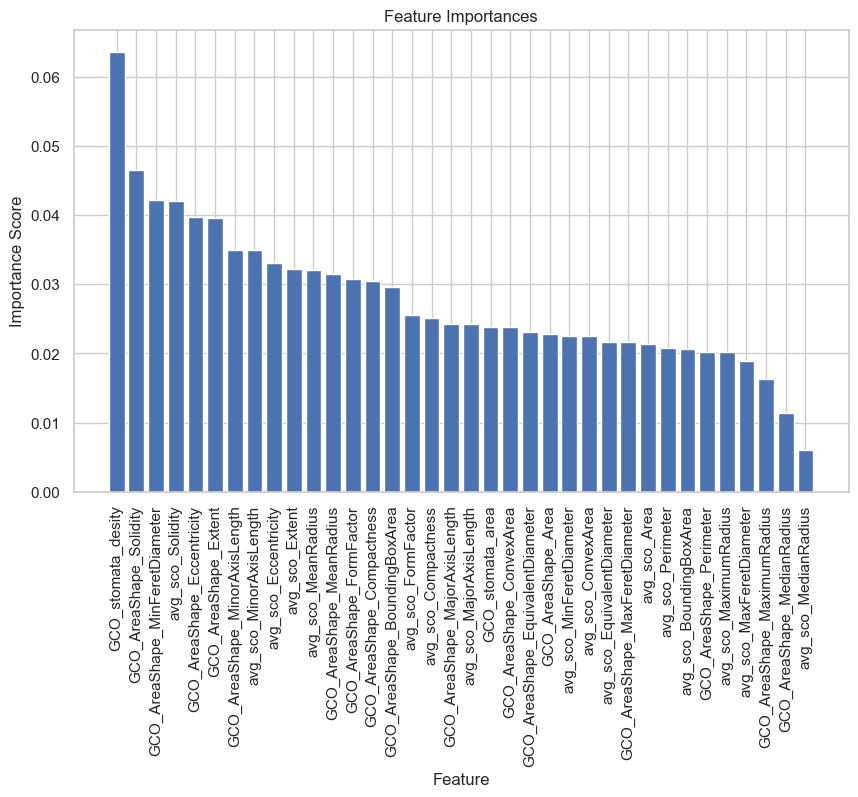

In [23]:
import matplotlib.pyplot as plt

# Get feature importances from the trained model
importances = rf_classifier.feature_importances_

# Sort feature importances in descending order
sorted_indices = importances.argsort()[::-1]
sorted_importances = importances[sorted_indices]

# Get the names of the features in the original order
feature_names = X.columns[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), sorted_importances, tick_label=feature_names)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('Feature Importances')
plt.show()


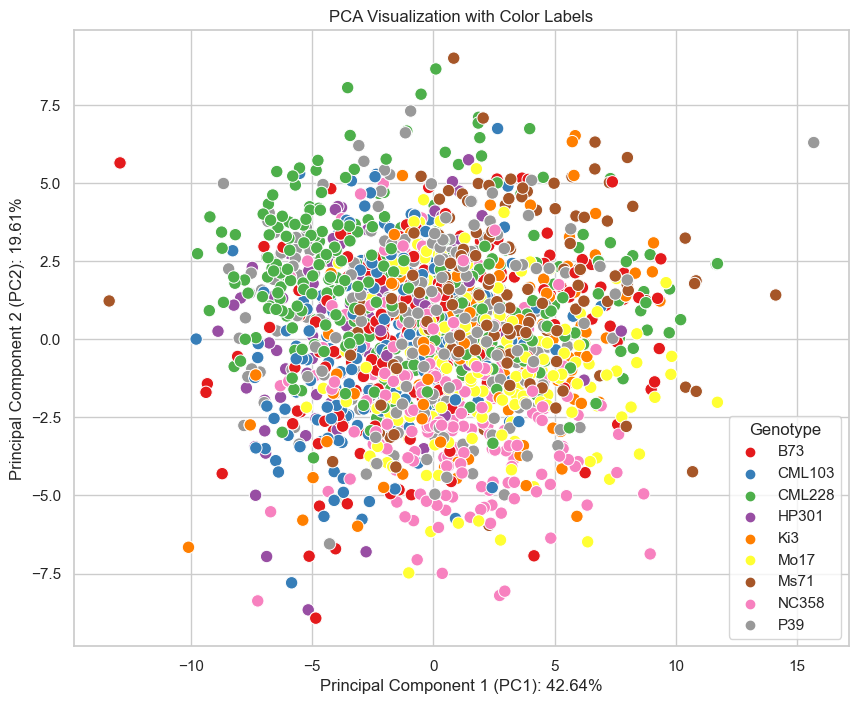

,Metadata_week.x,Metadata_genotype.x,Group,Subgroup,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,Week1,B73,SS,SS-B73,-1.12166,-0.661807,-0.622649,0.209595,-0.807230,0.605188,...,1.546256,2.167656,2.190959,-1.091239,0.214343,1.830905,1.702328,2.200104,2.210527,0.484450
1,Week1,B73,SS,SS-B73,-1.12166,-0.952431,-1.133549,-0.084646,-1.082191,0.285028,...,0.539743,1.166222,1.393158,-1.925854,1.884236,2.652819,2.538786,1.803868,2.157627,0.483503
2,Week1,B73,SS,SS-B73,-1.12166,0.367487,1.761549,1.319503,0.747357,0.977294,...,1.956298,2.622854,2.259735,0.081016,-0.614830,1.295124,1.097984,2.134064,1.325596,0.591787
3,Week1,B73,SS,SS-B73,-1.12166,-0.528604,0.474839,1.408502,-0.236157,1.096328,...,0.566039,-0.002118,0.609112,0.808182,0.236976,0.642828,0.008680,0.846299,-0.235712,0.619048
4,Week1,B73,SS,SS-B73,-1.12166,-0.601260,-0.319894,0.239039,-0.627448,0.535201,...,0.443095,0.893104,0.884216,-0.758447,0.819573,1.365247,1.019318,1.027907,1.136801,0.590778


In [24]:
# Redo the PCA base on average parameters of SCO1 and SCO2, lable by genotype
df = df_GC0_AVG_SCO.copy()



col_list = feature_names
selected_cols = df[col_list]


# Create a StandardScaler, Z score normalization
scaler = StandardScaler()

# Fit and transform the selected numeric columns
normalized_data = scaler.fit_transform(selected_cols)

# Replace the original numeric columns with the normalized values
df[selected_cols.columns] = normalized_data

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(normalized_data)

# Create a DataFrame with PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
pca_df = pd.DataFrame(data=pca_result, columns=pca_columns)

# Concatenate the PCA DataFrame with non-numeric columns
final_df = pd.concat([df_GC0_AVG_SCO.drop(columns=selected_cols.columns), pca_df], axis=1)


# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Metadata_genotype.x', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')

plt.show()


scaled_mor = df
scaled_mor.head()

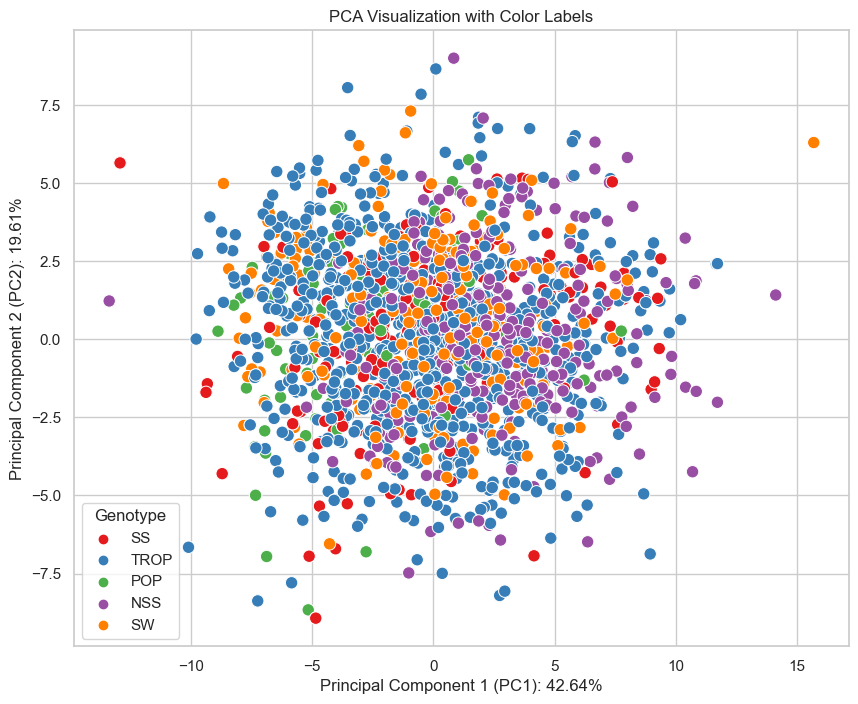

In [25]:
# Plotting PCA results with color labels based on 'Group'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Group', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')

plt.show()



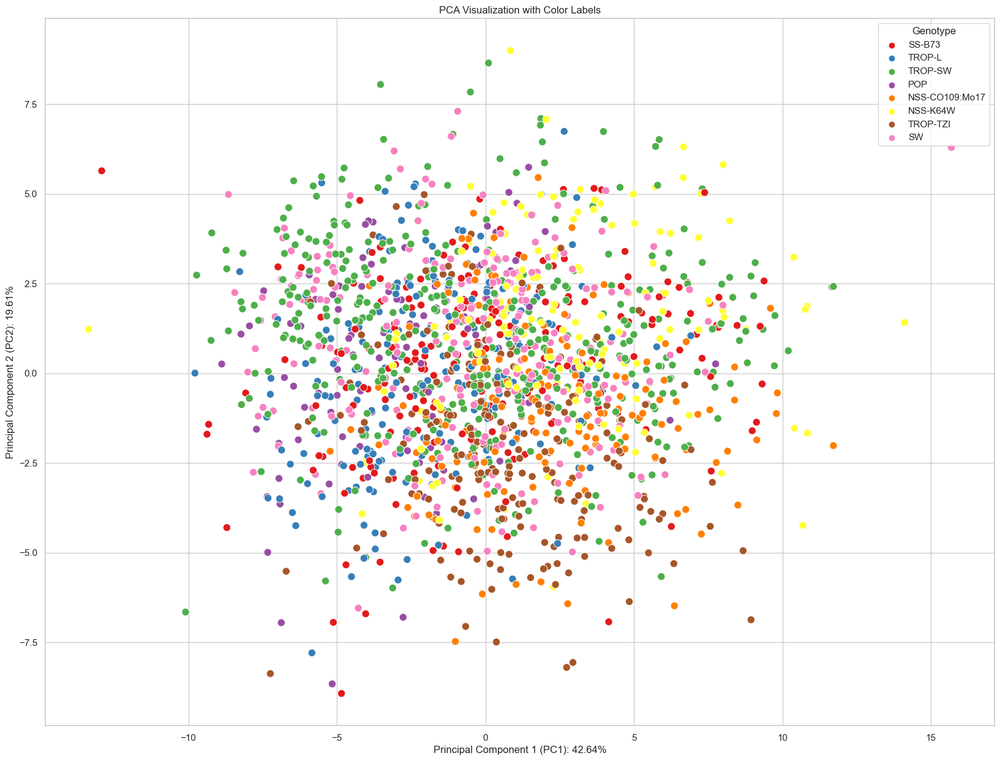

In [26]:
# Plotting PCA results with color labels based on 'Subgroup'
sns.set(style="whitegrid")
plt.figure(figsize=(20, 15))

sns.scatterplot(x='PC1', y='PC2', hue='Subgroup', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')

plt.show()


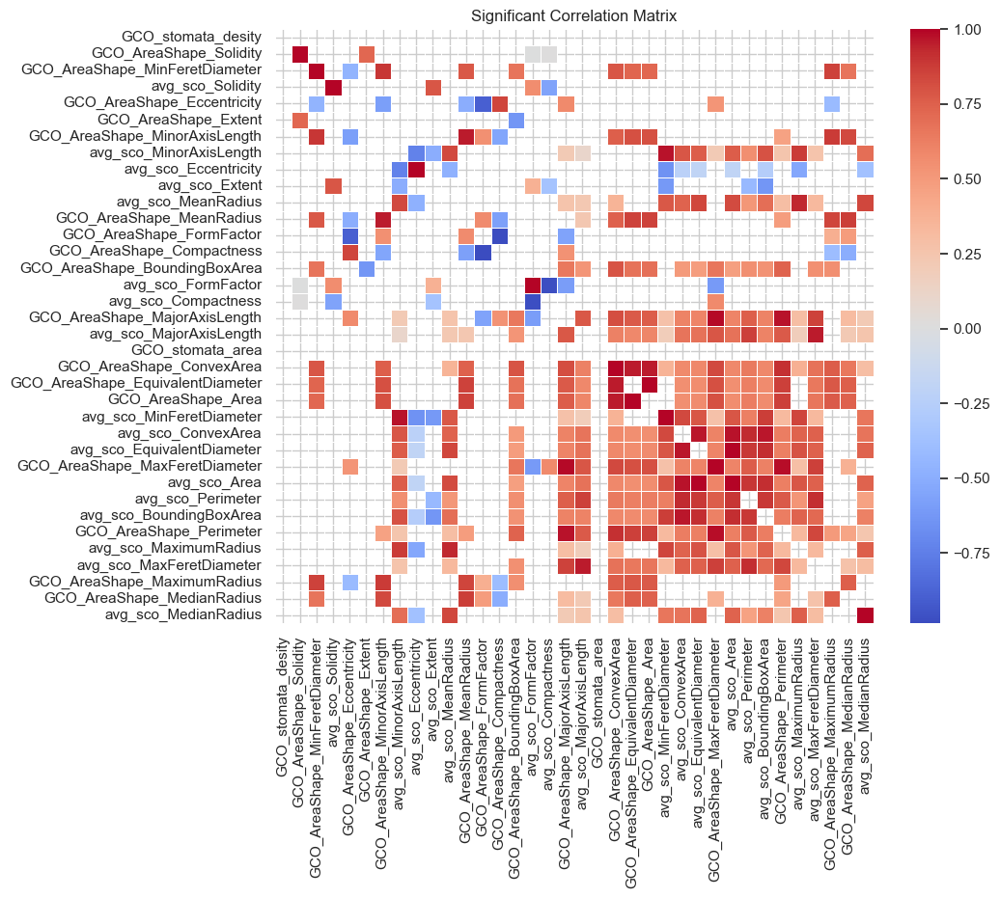

In [27]:
import pandas as pd

# Assuming df is your DataFrame
df = scaled_mor.copy()

# Select columns for correlation
selected_columns = selected_cols 
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()

# Select columns for correlation
selected_columns = selected_cols 
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()
import seaborn as sns
import matplotlib.pyplot as plt


# Filter for significant correlations (p < 0.05)
significant_correlations = correlation_matrix[(p_values < 0.01) & (p_values != 0)]

# Create a heatmap of the significant correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(significant_correlations, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Significant Correlation Matrix')
plt.show()




In [28]:
df_morph = df_GC0_AVG_SCO.copy()
aggregated_df = df_morph.groupby(['Metadata_week.x', 'Metadata_genotype.x']).mean().reset_index()

aggregated_df.to_csv("Oscar_aggregated_df.csv")
# Display the aggregated DataFrame
#print(aggregated_df)

#Metadata_week.x Metadata_genotype.x
gs_data = pd.read_csv("/users/houlinyu/Desktop/umass/image_analysis/gs_closing.csv")
aggregated_df.head()



# Assuming aggregated_df contains your data
df = aggregated_df.copy()

# Select numeric columns for normalization
numeric_columns = df.select_dtypes(include='number')

# Create a StandardScaler for Z-score normalization
scaler = StandardScaler()

# Fit and transform the selected numeric columns
normalized_numeric_data = scaler.fit_transform(numeric_columns)

# Replace the original numeric columns with the normalized values
df[numeric_columns.columns] = normalized_numeric_data

df.to_csv("Oscar_scaled_aggregate.csv")
df

/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_99035/996822502.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_df = df_morph.groupby(['Metadata_week.x', 'Metadata_genotype.x']).mean().reset_index()


,Metadata_week.x,Metadata_genotype.x,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,GCO_AreaShape_EquivalentDiameter,GCO_AreaShape_Extent,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,Week1,B73,-0.656582,-0.562248,0.426491,1.239617,-0.270287,1.129227,-0.520412,-1.131829,...,1.194916,1.541754,1.595600,-1.247360,0.481627,1.472205,1.382828,1.533420,1.584534,-1.940363
1,Week1,CML103,-1.649621,-0.498044,1.068186,0.672659,-0.357498,0.619022,-0.454401,-1.845996,...,-0.389273,-0.474731,-0.645512,1.281549,-0.833073,-1.031275,-0.961762,-0.698741,-1.035210,0.369813
2,Week1,CML228,-1.072503,-0.298513,-0.253272,3.146331,0.020351,2.215957,-0.359931,-0.190391,...,1.861208,1.395536,1.601627,0.623091,-1.089947,1.096546,0.984615,1.686677,0.760214,-1.919045
3,Week1,HP301,1.444694,-1.579212,-0.744353,-0.120819,-1.622915,0.010501,-1.580411,-0.586417,...,-1.261589,-0.899942,-1.139387,-0.774779,0.432824,-0.905052,-0.685277,-1.210200,-0.520143,-0.001483
4,Week1,Ki3,-0.339688,1.945620,1.400958,-0.505482,1.703598,-0.377343,1.873873,0.090667,...,1.188792,1.061705,0.881163,0.465854,-2.312720,-0.620037,-0.368498,0.387133,0.303055,1.065908
5,Week1,Mo17,1.418604,1.321289,0.519587,-0.922343,1.109262,-0.626479,1.291406,0.614391,...,1.613355,2.220752,2.143923,-2.241240,0.696901,2.132253,2.190321,2.141854,2.562852,-1.210280
6,Week1,Ms71,-1.536822,0.928380,0.287083,1.485653,0.813905,1.359508,0.922411,0.543047,...,2.055354,1.329513,1.438306,1.119802,-2.025731,0.457302,0.434785,1.427478,0.302094,-0.807038
7,Week1,NC358,-0.230600,0.942611,0.296873,-1.181958,0.960051,-1.386273,0.935083,0.418181,...,-0.468337,-0.813829,-0.558817,0.945301,0.517905,-0.181329,-0.603520,-0.327828,-0.852328,1.116022
8,Week1,P39,-0.736058,-2.099703,-0.787703,0.295526,-2.203340,0.431534,-2.183001,-0.981931,...,-0.798602,-0.684965,-0.651560,-0.213889,0.428903,-0.752595,-0.766415,-0.767875,-0.353307,-0.889697
9,Week2,B73,0.926614,-1.419512,-1.030719,0.005806,-1.472965,0.059839,-1.422832,-0.081565,...,-0.788376,-0.568808,-0.531735,-0.816575,1.184645,-0.031299,-0.035007,-0.488471,-0.017355,-0.736123


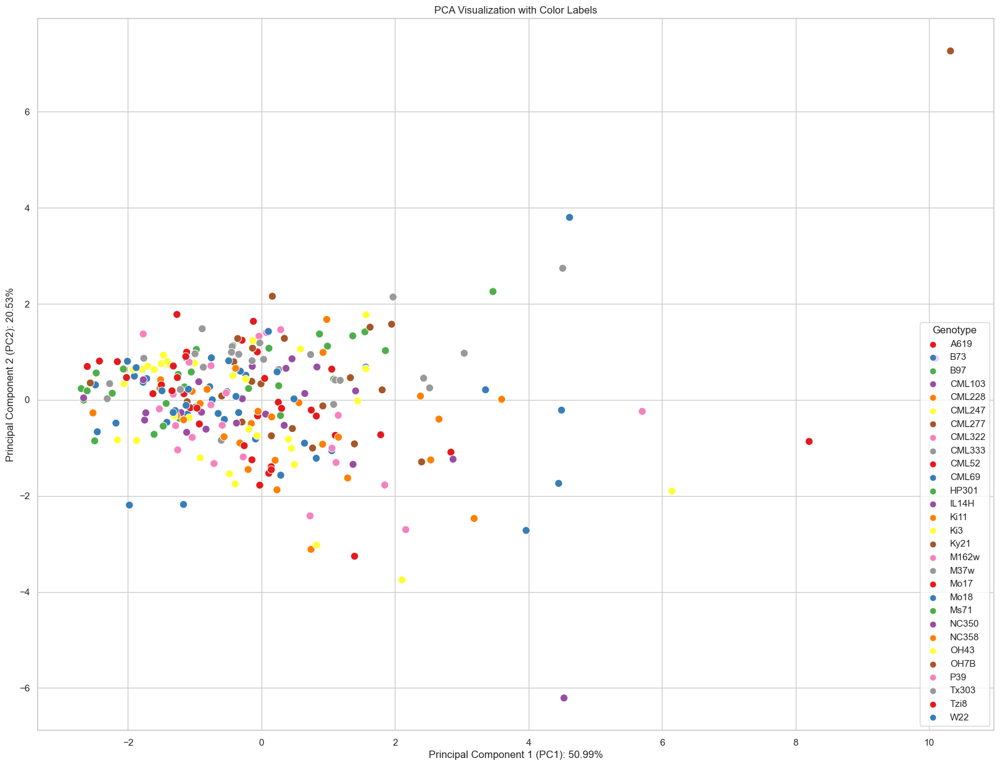

In [29]:
#normalize gs data before merge


# Select numeric columns for normalization

df = gs_data.copy()

numeric_columns = df.select_dtypes(include='number')

# Create a StandardScaler, Z score normalization
scaler = StandardScaler()

# Fit and transform the selected numeric columns
normalized_data = scaler.fit_transform(numeric_columns)

# Replace the original numeric columns with the normalized values
df[numeric_columns.columns] = normalized_data

df[numeric_columns.columns] = normalized_data

# Save the normalized DataFrame to a CSV file
df.to_csv("normalized_gs_data.csv", index=False)

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(normalized_data)

# Create a DataFrame with PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
pca_df = pd.DataFrame(data=pca_result, columns=pca_columns)

# Concatenate the PCA DataFrame with non-numeric columns
final_df = pd.concat([df.drop(columns=numeric_columns.columns), pca_df], axis=1)


#final_df.to_csv("final_df.csv")

# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(20, 15))

sns.scatterplot(x='PC1', y='PC2', hue='Genotype', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')



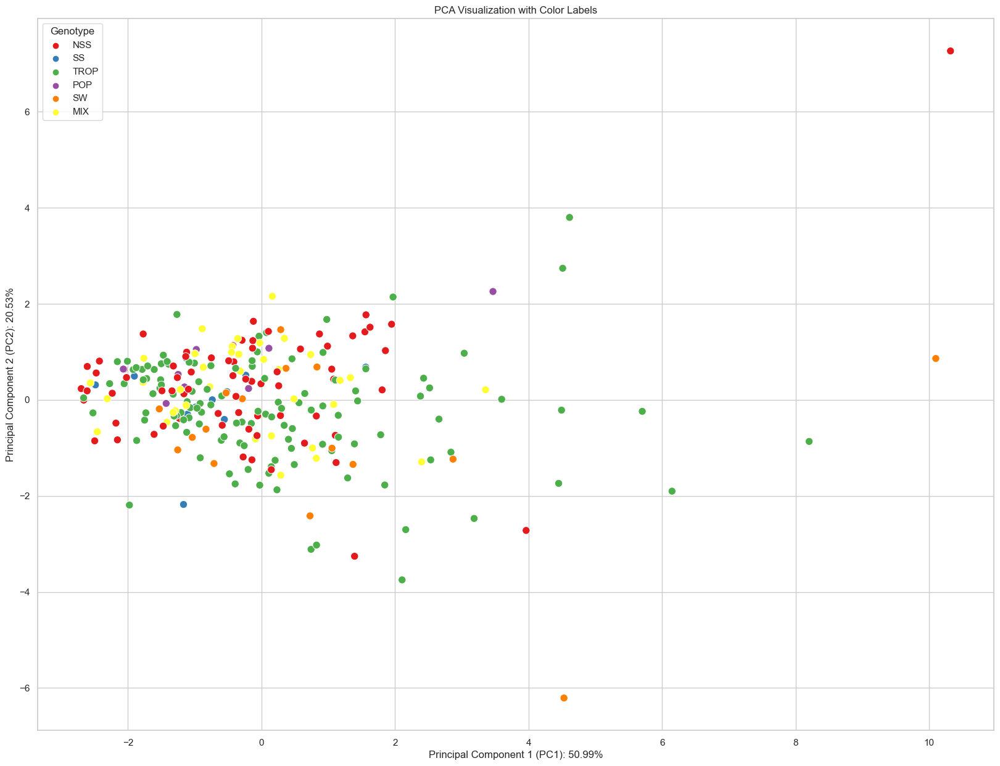

In [30]:
# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(20, 15))

sns.scatterplot(x='PC1', y='PC2', hue='Group', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')



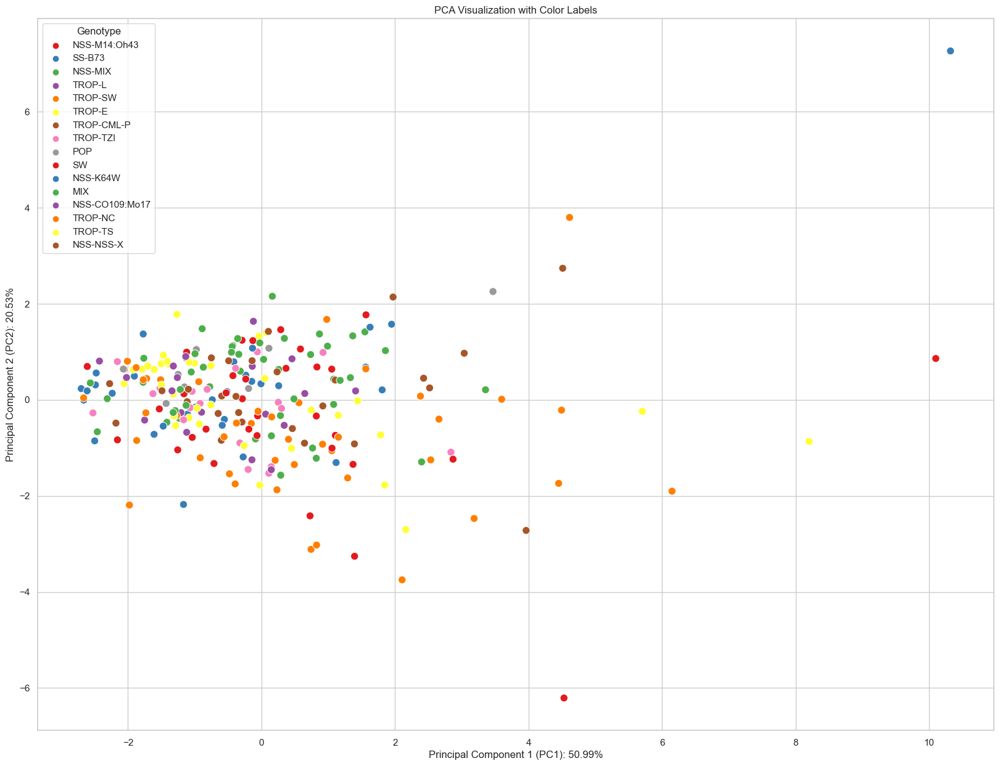

In [31]:
# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(20, 15))

sns.scatterplot(x='PC1', y='PC2', hue='Subgroup', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel(f'Principal Component 1 (PC1): {pca.explained_variance_ratio_[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 (PC2): {pca.explained_variance_ratio_[1]*100:.2f}%')
plt.legend(title='Genotype')



In [32]:
df = pd.read_csv("Oscar_scaled_aggregate.csv")

df['Metadata_week.x'] = df['Metadata_week.x'].str.extract('(\d+)')
df['Metadata_week.x'] = df['Metadata_week.x'].astype(str)
df.head()

,Unnamed: 0,Metadata_week.x,Metadata_genotype.x,GCO_stomata_desity,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,GCO_AreaShape_EquivalentDiameter,...,avg_sco_Perimeter,avg_sco_BoundingBoxArea,avg_sco_ConvexArea,avg_sco_Eccentricity,avg_sco_FormFactor,avg_sco_MeanRadius,avg_sco_MaximumRadius,avg_sco_Area,avg_sco_MinorAxisLength,Ratio_G_S_area
0,0,1,B73,-0.656582,-0.562248,0.426491,1.239617,-0.270287,1.129227,-0.520412,...,1.194916,1.541754,1.595600,-1.247360,0.481627,1.472205,1.382828,1.533420,1.584534,-1.940363
1,1,1,CML103,-1.649621,-0.498044,1.068186,0.672659,-0.357498,0.619022,-0.454401,...,-0.389273,-0.474731,-0.645512,1.281549,-0.833073,-1.031275,-0.961762,-0.698741,-1.035210,0.369813
2,2,1,CML228,-1.072503,-0.298513,-0.253272,3.146331,0.020351,2.215957,-0.359931,...,1.861208,1.395536,1.601627,0.623091,-1.089947,1.096546,0.984615,1.686677,0.760214,-1.919045
3,3,1,HP301,1.444694,-1.579212,-0.744353,-0.120819,-1.622915,0.010501,-1.580411,...,-1.261589,-0.899942,-1.139387,-0.774779,0.432824,-0.905052,-0.685277,-1.210200,-0.520143,-0.001483
4,4,1,Ki3,-0.339688,1.945620,1.400958,-0.505482,1.703598,-0.377343,1.873873,...,1.188792,1.061705,0.881163,0.465854,-2.312720,-0.620037,-0.368498,0.387133,0.303055,1.065908


In [33]:
df2 = pd.read_csv("normalized_gs_data.csv")

df2.head()



merged_NorGS_df = pd.merge(df, df2, 
                     left_on=['Metadata_week.x', 'Metadata_genotype.x'], 
                     right_on=['Round', 'Genotype'], 
                     how='left')
merged_NorGS_df.head()

merged_NorGS_df.to_csv("Oscar_normalized_morph_gs.csv")

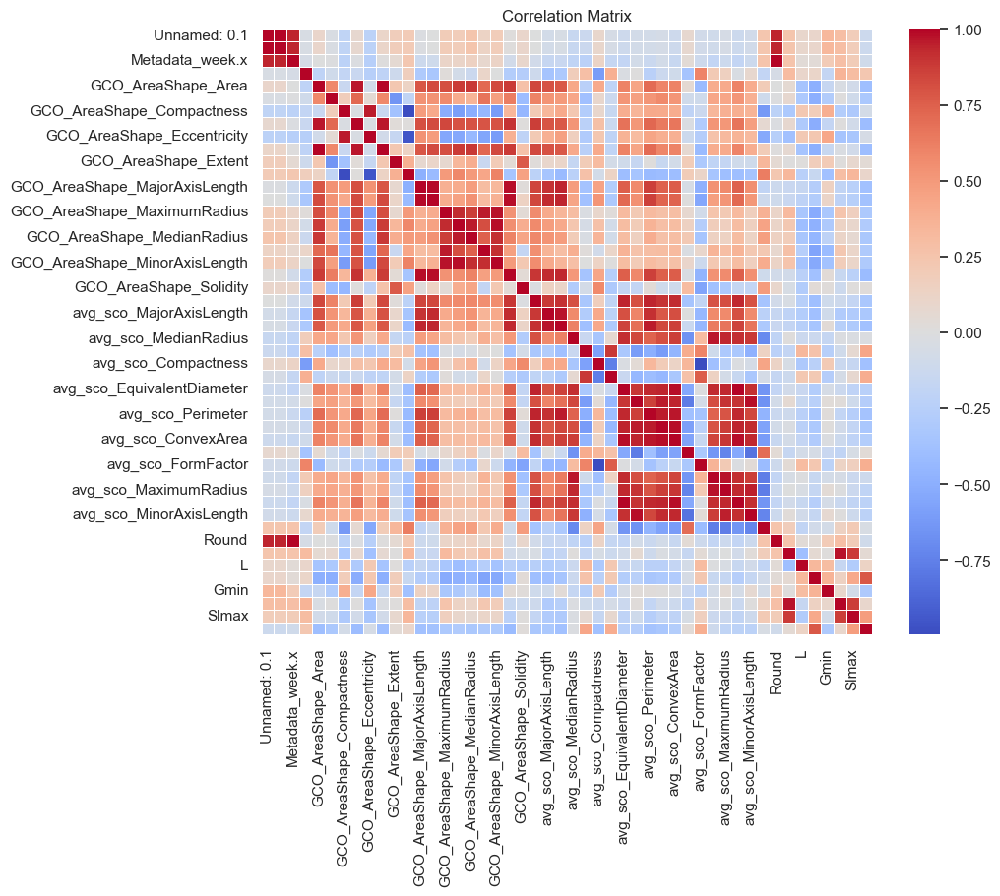

In [34]:
# Identify numeric and non-numeric columns

df = pd.read_csv("Oscar_normalized_morph_gs.csv")
numeric_columns = df.select_dtypes(include=['number']).columns
non_numeric_columns = df.select_dtypes(exclude=['number']).columns


# Separate data into numeric and non-numeric DataFrames
numeric_data = df[numeric_columns]
non_numeric_data = df[non_numeric_columns]

# Scale the numeric data using StandardScaler
#scaler = StandardScaler()
#scaled_numeric_data = scaler.fit_transform(numeric_data)
#print(scaled_numeric_data)
# Convert the scaled numeric data back to a DataFrame
#scaled_numeric_df = pd.DataFrame(scaled_numeric_data, columns=numeric_columns)

# Concatenate the non-numeric data and the scaled numeric data
#scaled_df = pd.concat([non_numeric_data, scaled_numeric_df], axis=1)

#scaled_df.to_csv("scaled_gs_morphology.csv", index = False)



# Select columns for correlation
selected_columns = numeric_data.dropna()
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()



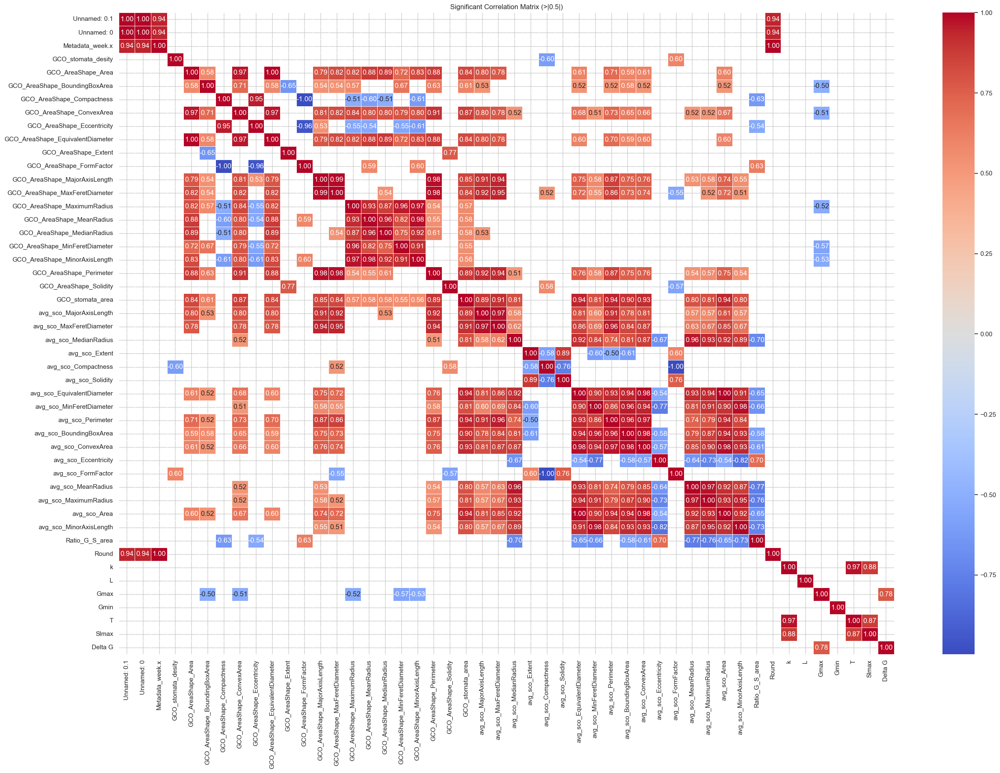

In [35]:
# Filter correlation matrix for significant values
threshold = 0.5 # Define your threshold for significance
significant_corr = correlation_matrix[(correlation_matrix >= threshold) | (correlation_matrix <= -threshold)]

# Create a heatmap of the significant correlations
plt.figure(figsize=(30, 20))
sns.heatmap(significant_corr, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Significant Correlation Matrix (>|0.5|)')
plt.show()

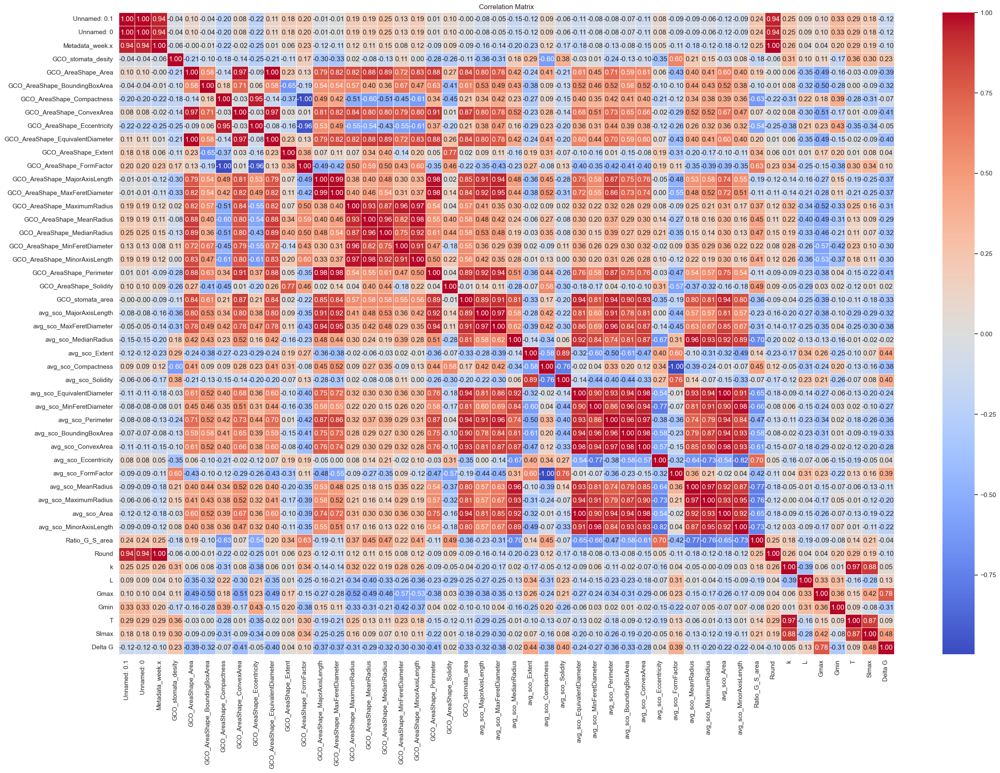

In [36]:
# Create a heatmap of the correlation matrix


plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()